# process fits, save results (iterative)

host = ```any```, device = ```cuda:1```

**Motivation**: <br>

From ```Dropbox/chkpts/_TemporalSC``` to ```../tmp/results_2025-08```

In [1]:
# HIDE CODE


project_name = '_TemporalSC'


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-progress-2025/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-progress-2025/figs')
tmp_dir = os.path.join(git_dir, 'jb-progress-2025/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, project_name))
from figures.convergence import plot_convergence
from main.config_defaults import default_configs
from figures.fighelper import *
from main.train import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
from analysis.final import perform_analysis, get_root_path


device_idx = 1
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:1  ———  host: chewie

## Results dir

In [3]:
root = get_root_path()
results_dir = pjoin(tmp_dir, 'results_2025-08')
os.makedirs(results_dir, exist_ok=True)

print(root)
len(os.listdir(results_dir))

/home/hadi/Dropbox/chkpts/_TemporalSC

107

### Select fits

In [4]:
cond = lambda f: 'vH16-wht' in f and ('tbptt' in f or '2025_08_19' in f)

fits = sorted(os.listdir(root), key=alphanum_sort_key)
fits = [f for f in fits if cond(f)]

len(fits)

40

In [5]:
print(fits)

[
    'poisson_<ngd|lin>_vH16-wht_t-16_b-0.5_kms-(512,1,1)_tbptt-1_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-0.5_kms-(512,1,1)_tbptt-2_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-0.5_kms-(512,1,1)_tbptt-4_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-0.5_kms-(512,1,1)_tbptt-8_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-0.5_kms-(512,1,1)_tbptt-16_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-1_kms-(512,1,1)_tbptt-1_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-1_kms-(512,1,1)_tbptt-2_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-1_kms-(512,1,1)_tbptt-4_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-1_kms-(512,1,1)_tbptt-8_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-1_kms-(512,1,1)_tbptt-16_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-2_kms-(512,1,1)_tbptt-1_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-2_kms-(512,1,1)_tbptt-2_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-2_kms-(512,1,1)_tbptt-4_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-2_kms-(512,1,1)_tbptt-8_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-2_kms-(512,1,1)_tbptt-16_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-4_kms-(512,1,1)_tbptt-1_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-4_kms-(512,1,1)_tbptt-2_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-4_kms-(512,1,1)_tbptt-4_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-4_kms-(512,1,1)_tbptt-8_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-4_kms-(512,1,1)_tbptt-16_mach-0_(2025_08_18,13:16)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-8_kms-(512,1,1)_tbptt-1_mach-0_(2025_08_19,14:06)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-8_kms-(512,1,1)_tbptt-2_mach-0_(2025_08_19,14:06)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-8_kms-(512,1,1)_tbptt-4_mach-0_(2025_08_19,21:17)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-8_kms-(512,1,1)_tbptt-8_mach-0_(2025_08_19,14:06)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-8_kms-(512,1,1)_tbptt-16_mach-0_(2025_08_19,14:06)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-12_kms-(512,1,1)_tbptt-1_mach-0_(2025_08_19,14:06)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-12_kms-(512,1,1)_tbptt-2_mach-0_(2025_08_19,14:06)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-12_kms-(512,1,1)_tbptt-4_mach-0_(2025_08_19,20:55)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-12_kms-(512,1,1)_tbptt-8_mach-0_(2025_08_19,14:06)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-12_kms-(512,1,1)_tbptt-16_mach-0_(2025_08_19,14:06)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-16_kms-(512,1,1)_mach-0_(2025_08_19,00:27)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-16_kms-(512,1,1)_tbptt-2_mach-0_(2025_08_19,14:06)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-16_kms-(512,1,1)_tbptt-4_mach-0_(2025_08_19,19:28)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-16_kms-(512,1,1)_tbptt-8_mach-0_(2025_08_19,14:06)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-16_kms-(512,1,1)_tbptt-16_mach-0_(2025_08_18,22:09)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-24_kms-(512,1,1)_mach-0_(2025_08_19,00:07)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-24_kms-(512,1,1)_tbptt-2_mach-0_(2025_08_19,14:06)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-24_kms-(512,1,1)_tbptt-4_mach-0_(2025_08_18,22:36)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-24_kms-(512,1,1)_tbptt-8_mach-0_(2025_08_18,22:13)',
    'poisson_<ngd|lin>_vH16-wht_t-16_b-24_kms-(512,1,1)_tbptt-16_mach-0_(2025_08_18,21:56)'
]

### Run analysis loop

  0%|                                                    | 0/40 [00:00<?, ?it/s]

[PROGRESS] 'poisson_<ngd|lin>_vH16-wht_t-16_b-16_kms-(512,1,1)_mach-0_(2025_08_19,00:27).npy' saved at
/home/hadi/Dropbox/git/jb-progress-2025/tmp/results_2025-08

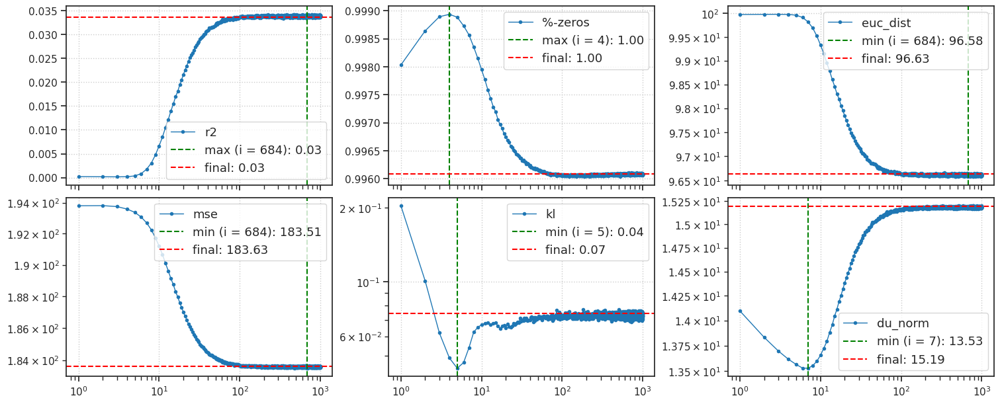

----------------------------------------------------------------------------------------------------

 78%|█████████████████████████████████▎         | 31/40 [00:52<00:15,  1.70s/it]

[PROGRESS] 'poisson_<ngd|lin>_vH16-wht_t-16_b-24_kms-(512,1,1)_mach-0_(2025_08_19,00:07).npy' saved at
/home/hadi/Dropbox/git/jb-progress-2025/tmp/results_2025-08

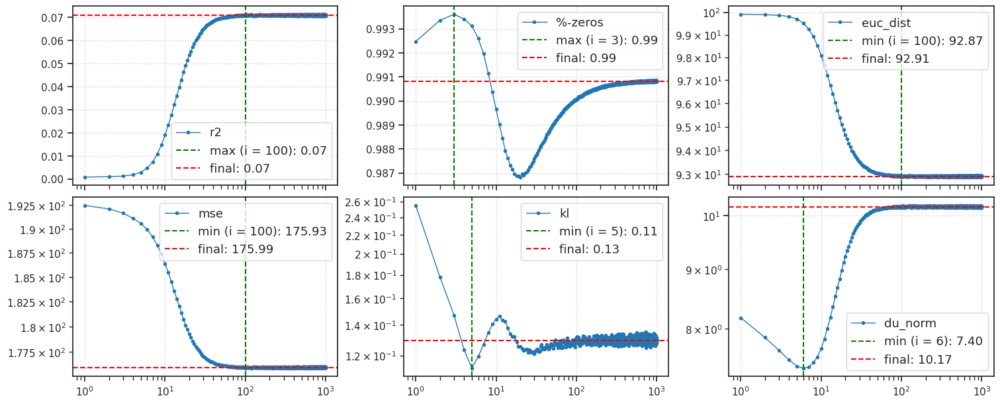

----------------------------------------------------------------------------------------------------

100%|███████████████████████████████████████████| 40/40 [01:45<00:00,  2.63s/it]

CPU times: user 1min 45s, sys: 492 ms, total: 1min 45s
Wall time: 1min 45s


In [6]:
%%time

perform_analysis(results_dir, device, fits, override_fits=False)

## Plot features

beta = 0.5,
tbptt = 1,

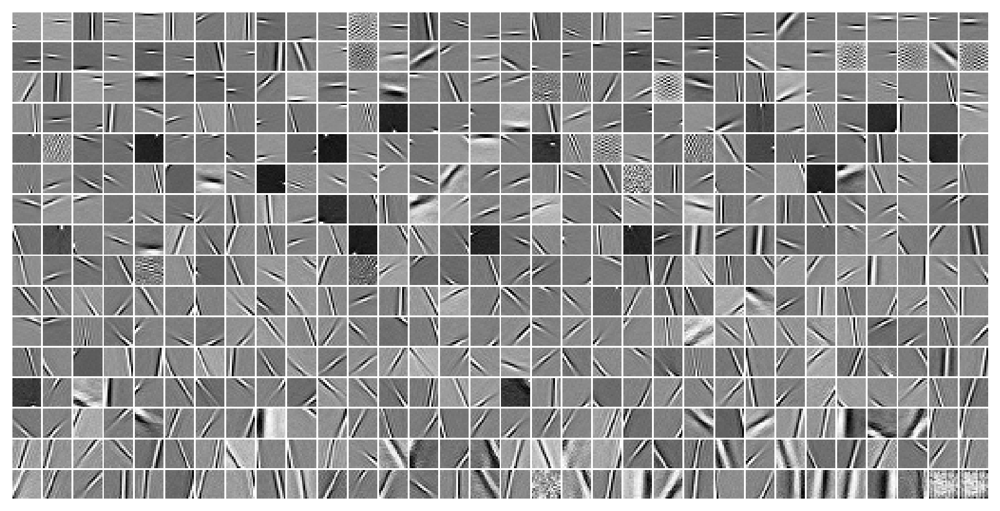

beta = 0.5,
tbptt = 2,

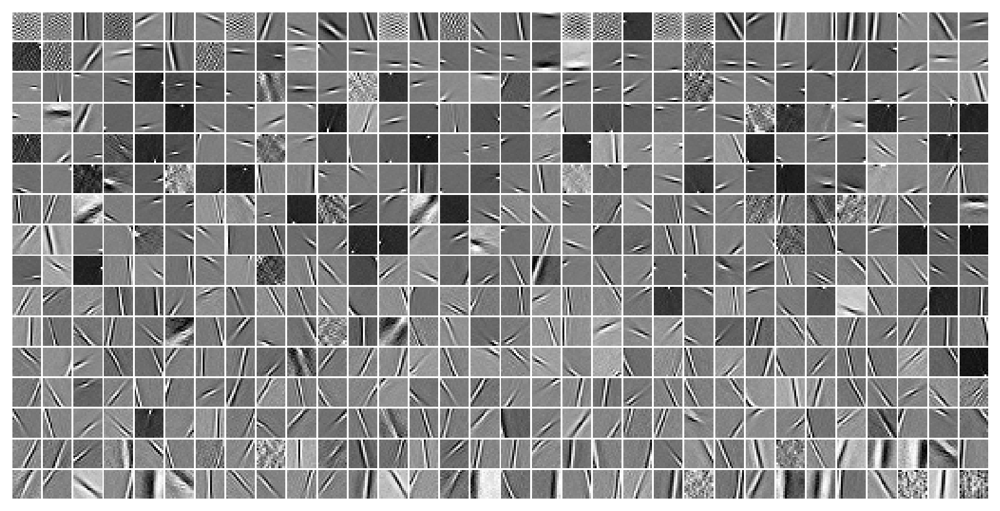

beta = 0.5,
tbptt = 4,

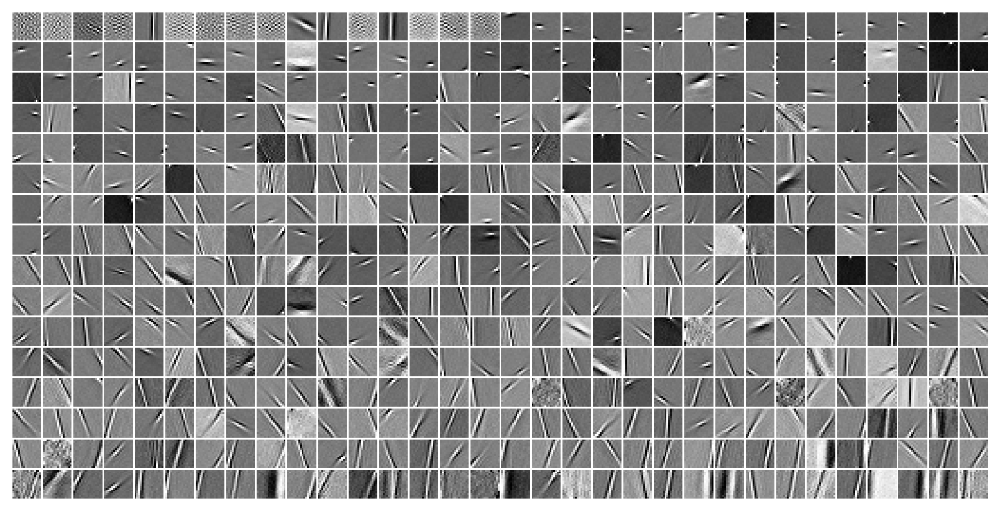

beta = 0.5,
tbptt = 8,

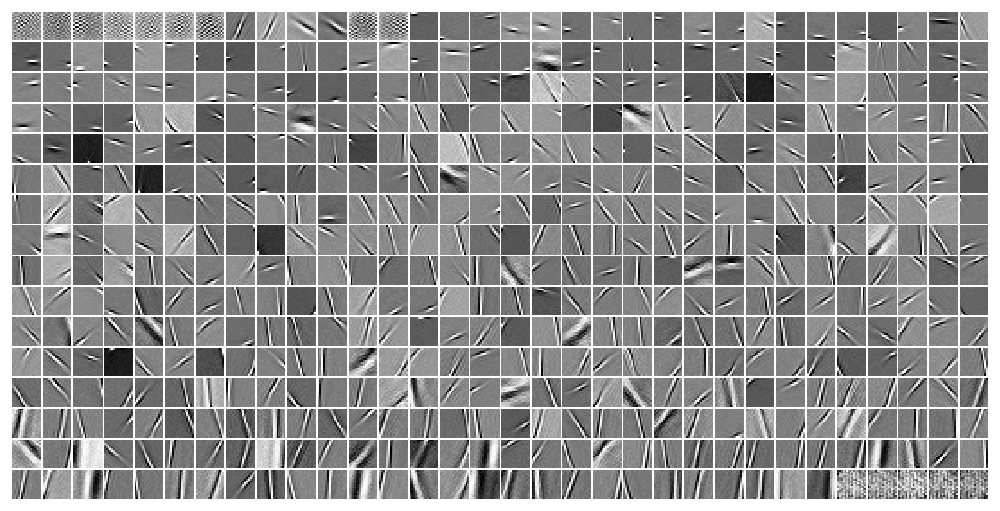

beta = 0.5,
tbptt = 16,

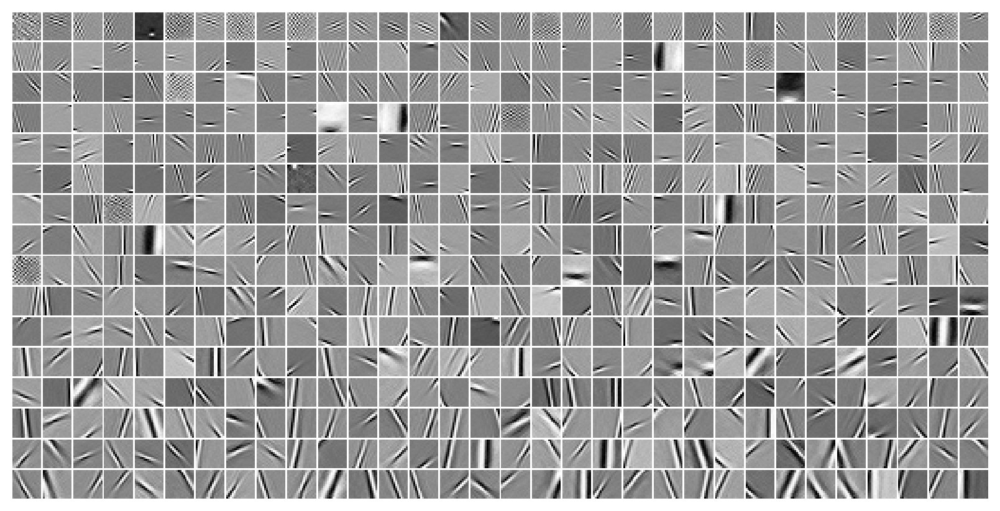

beta = 1.0,
tbptt = 1,

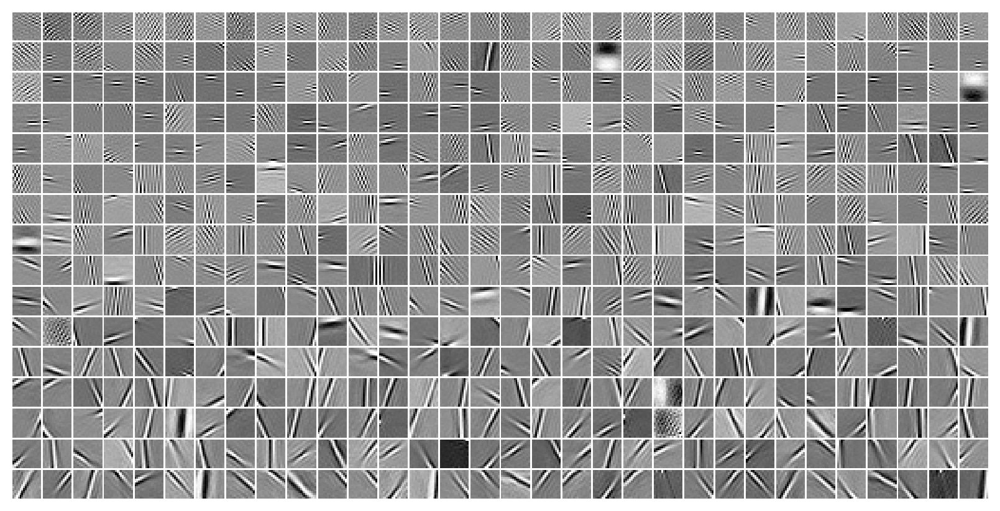

beta = 1.0,
tbptt = 2,

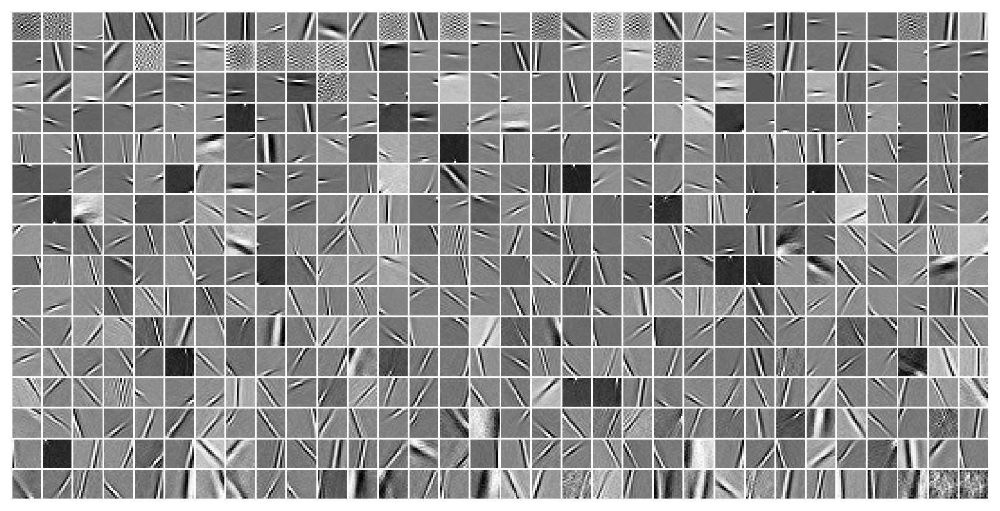

beta = 1.0,
tbptt = 4,

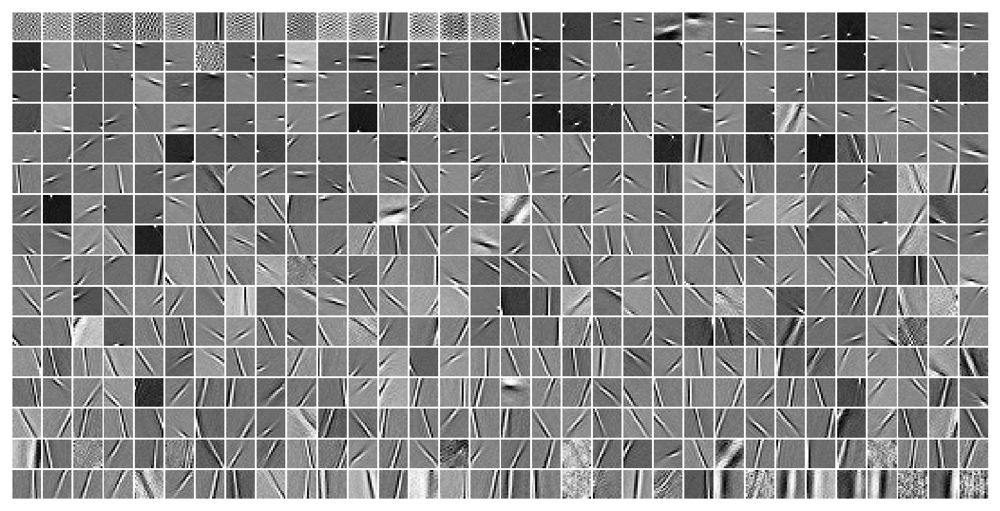

beta = 1.0,
tbptt = 8,

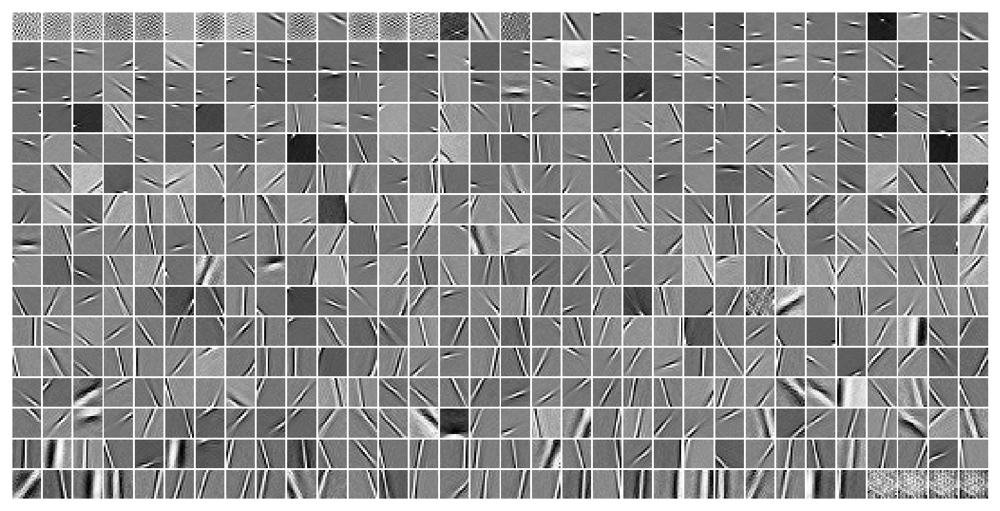

beta = 1.0,
tbptt = 16,

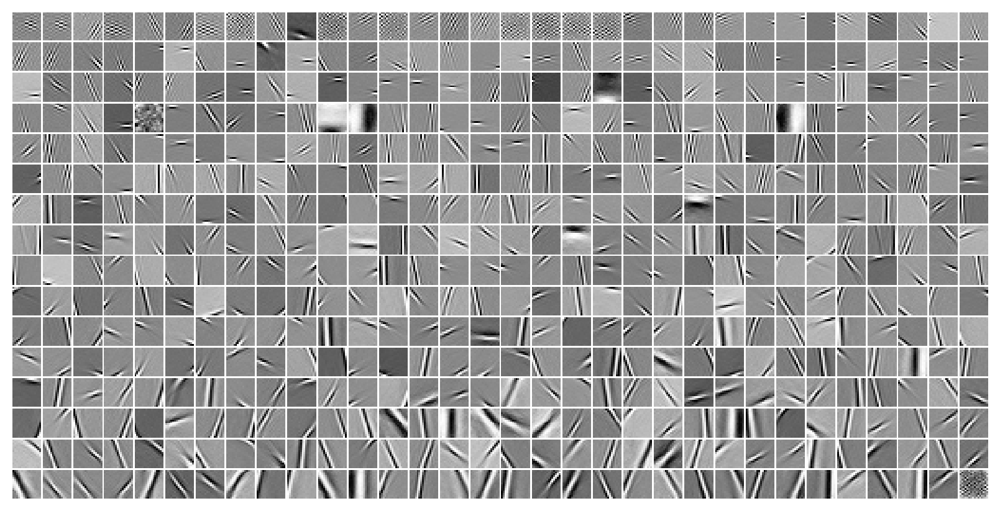

beta = 2.0,
tbptt = 1,

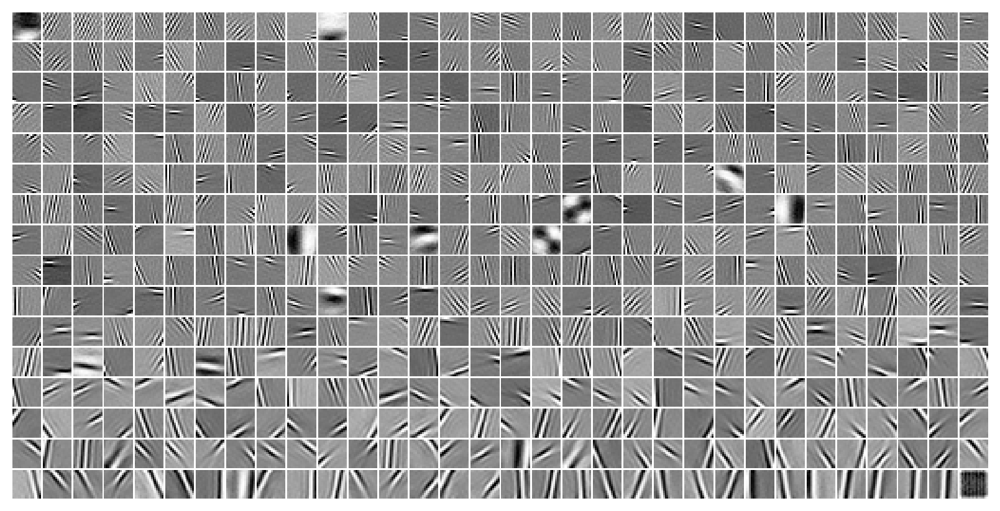

beta = 2.0,
tbptt = 2,

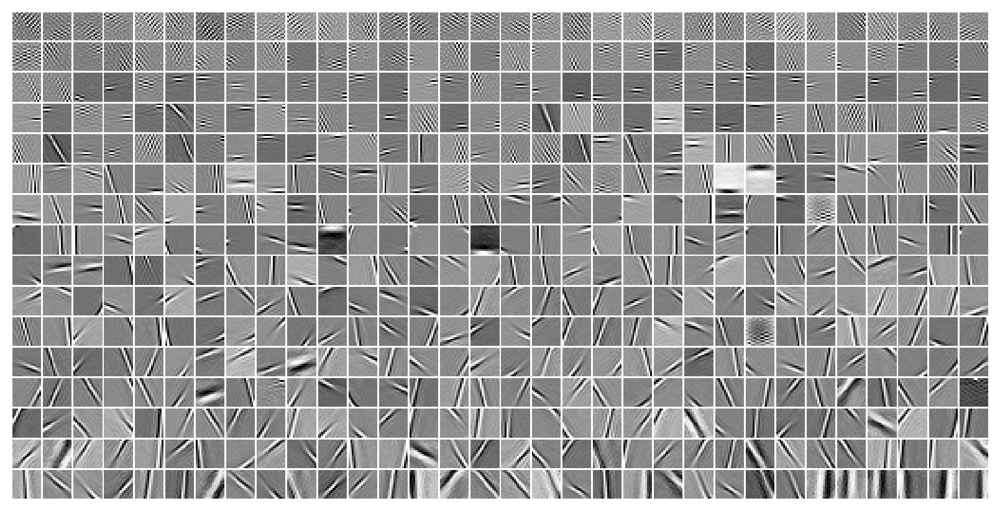

beta = 2.0,
tbptt = 4,

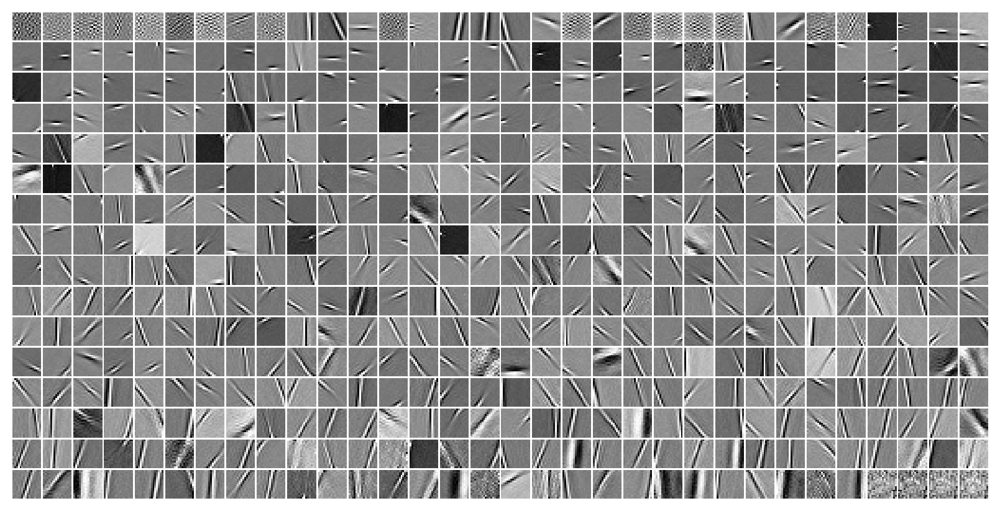

beta = 2.0,
tbptt = 8,

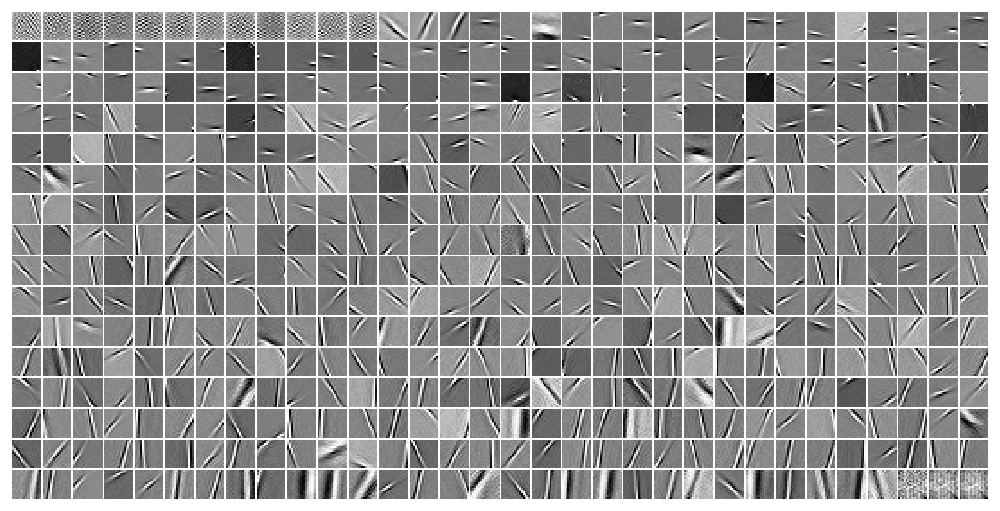

beta = 2.0,
tbptt = 16,

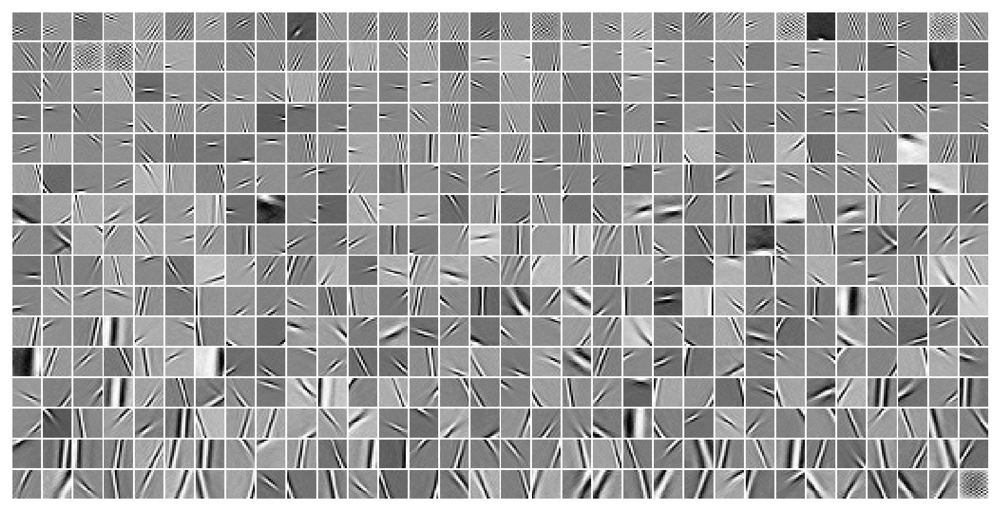

beta = 4.0,
tbptt = 1,

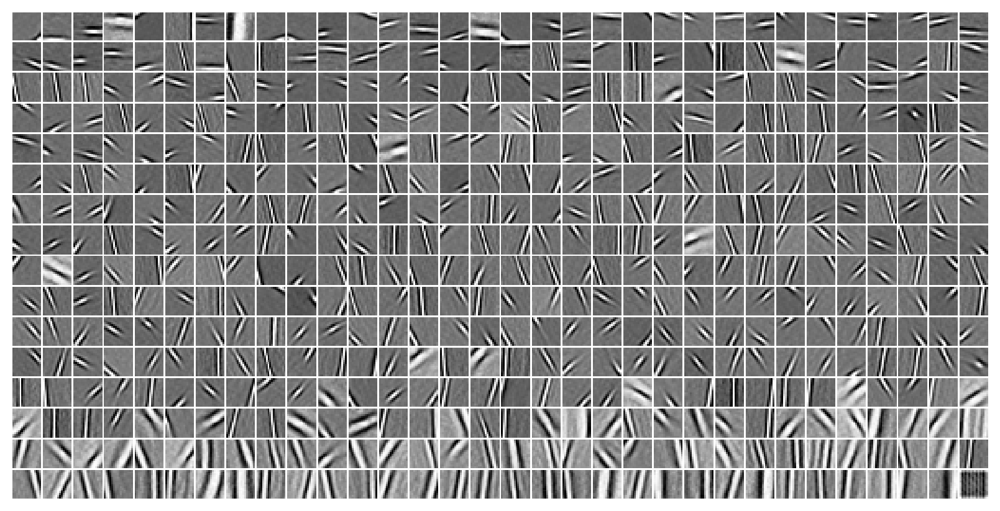

beta = 4.0,
tbptt = 2,

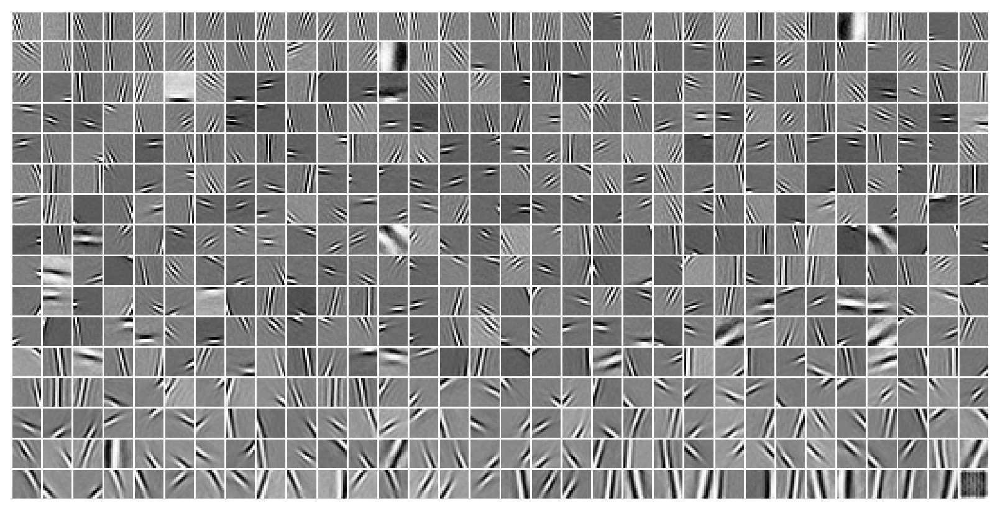

beta = 4.0,
tbptt = 4,

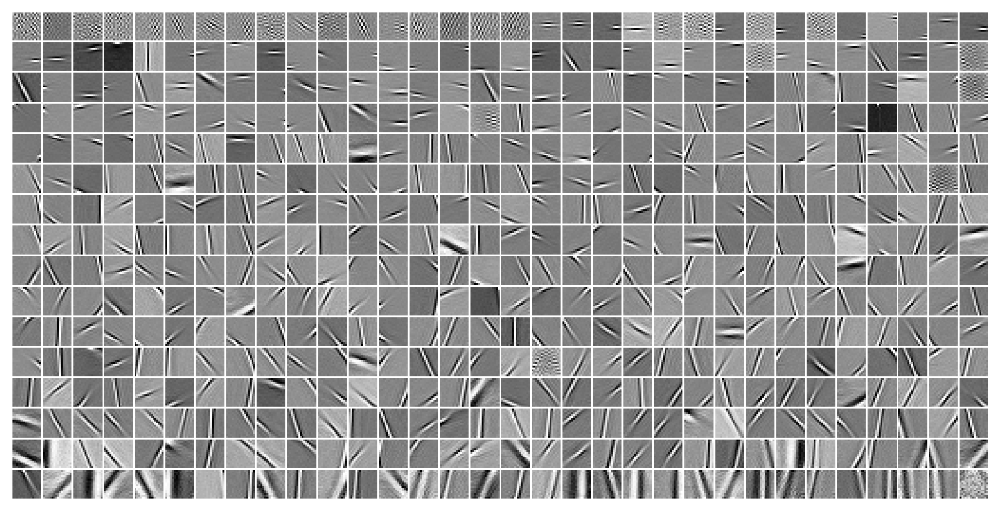

beta = 4.0,
tbptt = 8,

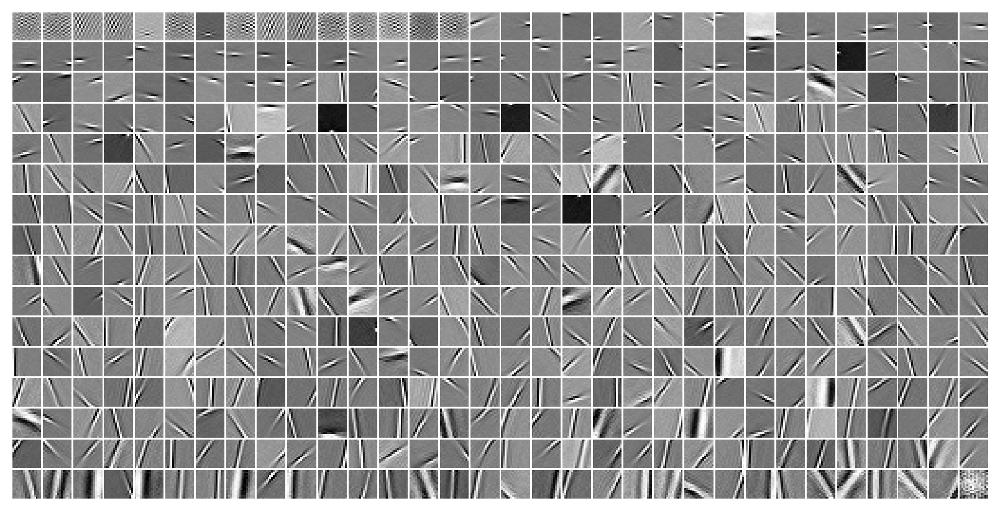

beta = 4.0,
tbptt = 16,

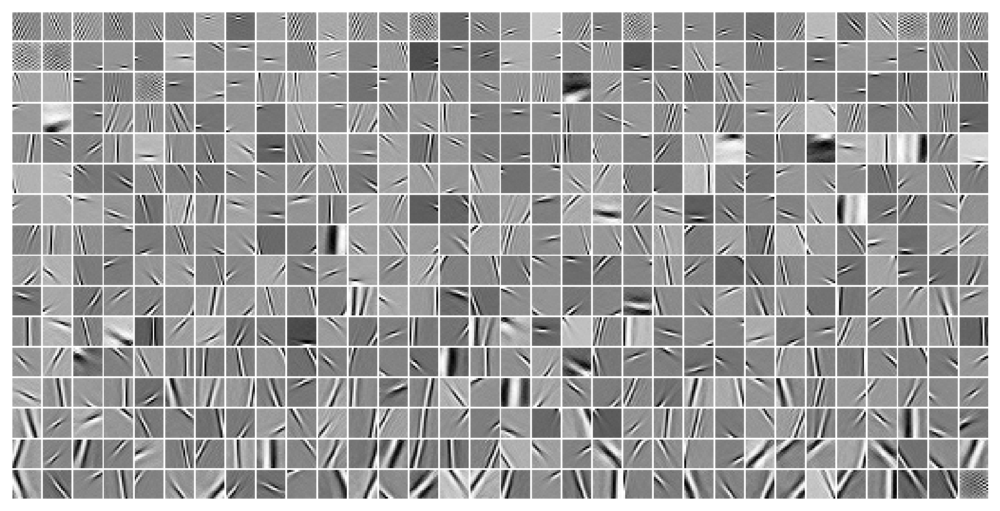

In [ ]:
for name in fits:
    tr, meta = load_model_lite(
        pjoin(root, name),
        device=device,
        shuffle=False,
        verbose=False,
        strict=True,
    )
    u0 = tonp(tr.model.layer.u_init[0].squeeze())

    try:  # temporary solution
        tbptt = int_from_str(next(
            e for e in name.split('_')
            if 'tbptt' in e
        ))
    except StopIteration:
        tbptt = 1
    print(f"beta = {tr.model.cfg.kl_beta},\ntbptt = {tbptt},")
    _ = tr.model.show(order=np.argsort(u0))
    print('\n')

k-[32]

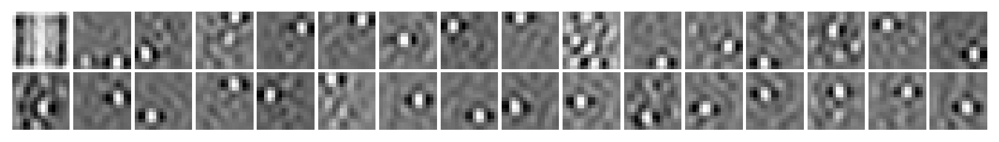

k-[64]

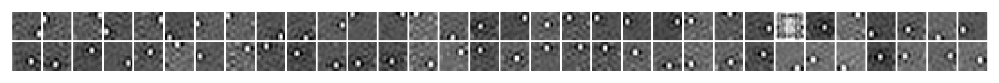

k-[128]

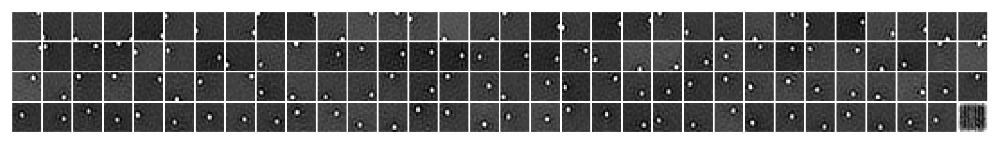

k-[256]

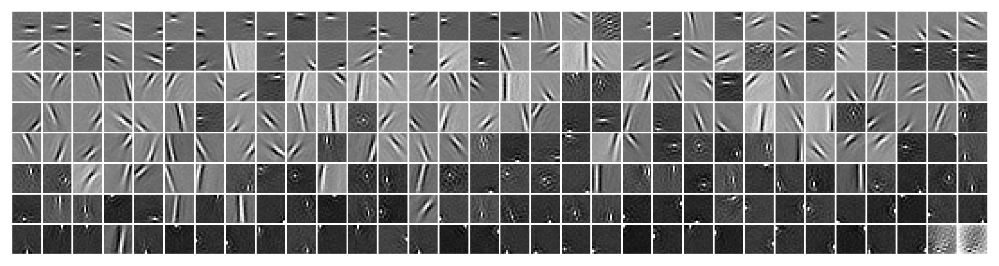

k-[512]

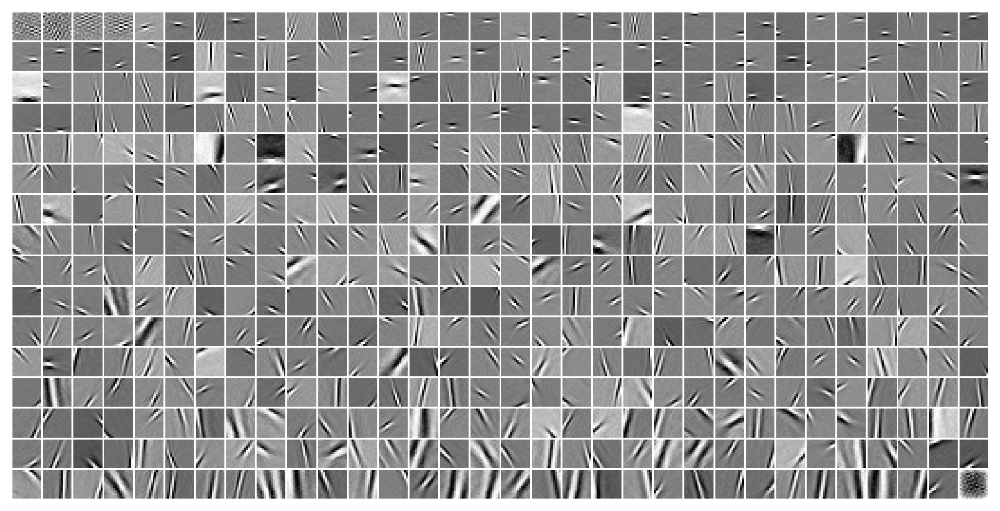

k-[768]

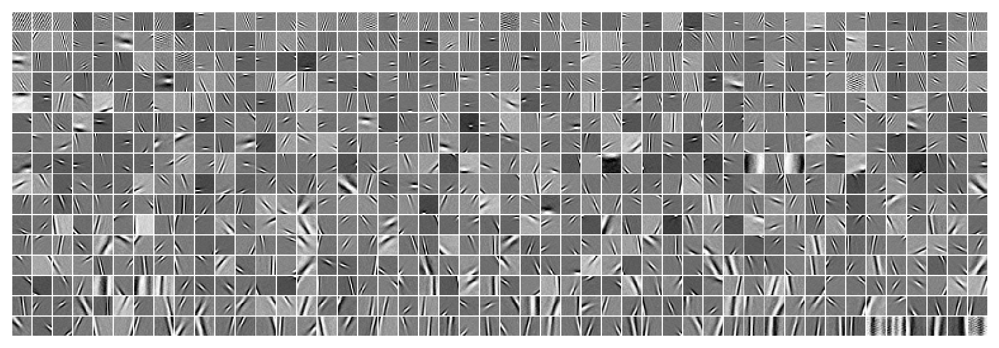

k-[1024]

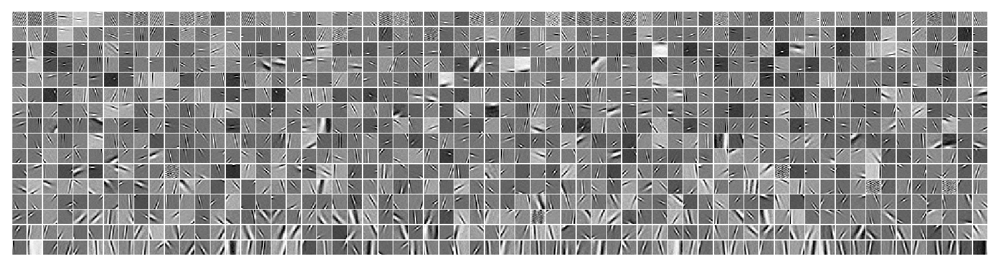

k-[2048]

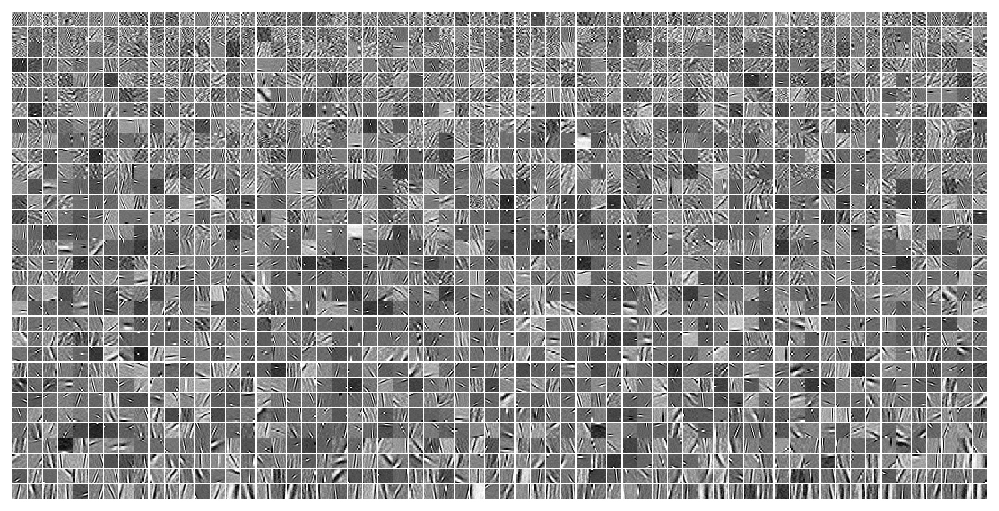